# Visualizations using Plotly

### Importing necessary libraries

- https://www.geeksforgeeks.org/data-visualization-with-python/

In [1]:
! pip install plotly==5.22.0

You should consider upgrading via the 'C:\Users\HP\AppData\Local\Programs\Python\Python310\python.exe -m pip install --upgrade pip' command.


In [2]:
! pip install matplotlib

You should consider upgrading via the 'C:\Users\HP\AppData\Local\Programs\Python\Python310\python.exe -m pip install --upgrade pip' command.


In [3]:
! pip install Seaborn

You should consider upgrading via the 'C:\Users\HP\AppData\Local\Programs\Python\Python310\python.exe -m pip install --upgrade pip' command.


In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import random

In [5]:
# we shall use this function to convert all dataframe columns to upper case.
# this is only for aesthetics.
def columns_to_upper(df):
    df.columns = [col.upper() for col in df.columns]
    return df

### Reading data as pandas dataframe

In [6]:
employee_data = pd.read_csv('D:/[Z] Python [Sanjeev]/Python Practice/Data/employee_data2.csv')

In [7]:
employee_data.columns

Index(['Unnamed: 0', 'avg_monthly_hrs', 'department', 'filed_complaint',
       'last_evaluation', 'n_projects', 'recently_promoted', 'salary',
       'satisfaction', 'status', 'tenure', 'employee_id', 'dept_name',
       'dept_head', 'age', 'gender', 'marital_status'],
      dtype='object')

In [8]:
employee_data = columns_to_upper(employee_data)
employee_data.head()

,UNNAMED: 0,AVG_MONTHLY_HRS,DEPARTMENT,FILED_COMPLAINT,LAST_EVALUATION,N_PROJECTS,RECENTLY_PROMOTED,SALARY,SATISFACTION,STATUS,TENURE,EMPLOYEE_ID,DEPT_NAME,DEPT_HEAD,AGE,GENDER,MARITAL_STATUS
0,0,246.0,D00-PD,0.0,0.866838,6,0.0,medium,0.134415,Left,4.0,124467,Product,Darcy Staines,42.0,Female,Married
1,1,134.0,D00-PD,0.0,0.555718,2,0.0,low,0.511041,Left,3.0,112210,Product,Darcy Staines,23.0,Female,Unmarried
2,2,156.0,D00-SS,1.0,0.474082,2,0.0,medium,0.405101,Left,3.0,126150,Sales,Edward J Bayley,24.0,Female,Unmarried
3,3,256.0,D00-SP,0.0,0.961360,6,0.0,low,0.152974,Left,4.0,125346,Support,Amelia Westray,51.0,Female,Married
4,4,146.0,D00-SS,0.0,0.507349,2,0.0,medium,0.434845,Left,3.0,113707,Sales,Edward J Bayley,23.0,Female,Unmarried


In [9]:
employee_data.isnull().sum()

UNNAMED: 0           0
AVG_MONTHLY_HRS      0
DEPARTMENT           0
FILED_COMPLAINT      0
LAST_EVALUATION      0
N_PROJECTS           0
RECENTLY_PROMOTED    0
SALARY               0
SATISFACTION         0
STATUS               0
TENURE               0
EMPLOYEE_ID          0
DEPT_NAME            0
DEPT_HEAD            0
AGE                  0
GENDER               0
MARITAL_STATUS       0
dtype: int64

### Visualizations to find underlying patterns

#### 1. Univariate Categorical data analysis
- Univariate:             means it is looking at 1 column
- Univariate Categorical: means it is looking at categorical column
- Univariate continuos:   means it is looking at continuos column

##### 1.1 Count/Bar Plots

In [10]:
# get unique values of a column
employee_data['DEPT_NAME'].unique()

array(['Product', 'Sales', 'Support', 'Marketing', 'IT', 'Admin',
       'Management', 'Engineering', 'Procurement', 'Temp', 'Finance'],
      dtype=object)

In [11]:
employee_data['DEPT_NAME'].value_counts()

DEPT_NAME
Sales          3905
Engineering    2575
Support        2113
Product        1562
IT             1364
Marketing       815
Finance         725
Management      593
Admin           175
Procurement     173
Temp            150
Name: count, dtype: int64

In [12]:
# get nunique values of a column
employee_data['DEPT_NAME'].nunique()

11

<Axes: xlabel='DEPT_NAME', ylabel='count'>

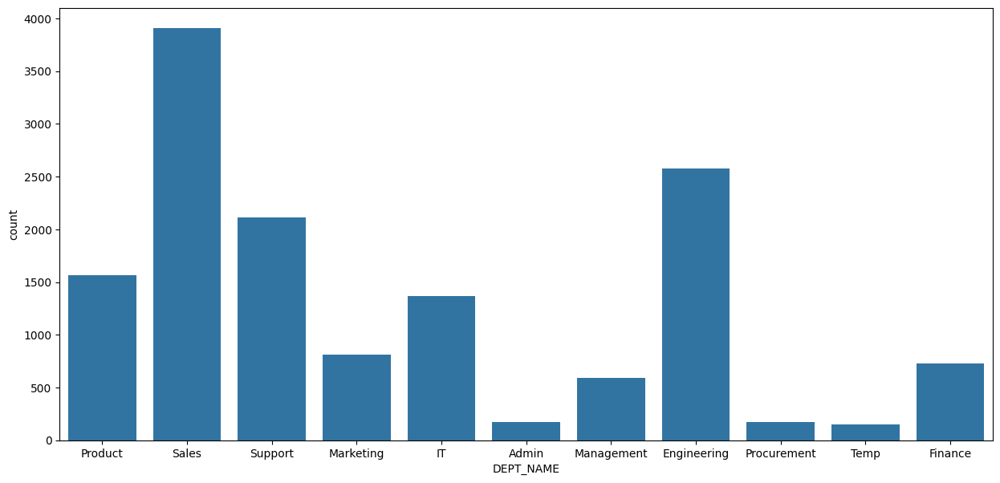

In [13]:
# Here i am using matplotlib
# univariate categorical data analysis
# if you want to define the canvas that we want then we will use "plt.figure(width,height)"

fig = plt.figure(figsize=(15, 7))
sns.countplot(x='DEPT_NAME', data=employee_data)

In [14]:
# Here we are seeing "count"
employee_data.groupby(['DEPT_NAME']).agg({'EMPLOYEE_ID':'count'})

,EMPLOYEE_ID
DEPT_NAME,
Admin,175
Engineering,2575
Finance,725
IT,1364
Management,593
Marketing,815
Procurement,173
Product,1562
Sales,3905


In [15]:
employee_data.groupby(['DEPT_NAME']).agg({'EMPLOYEE_ID':'count'}).reset_index()

,DEPT_NAME,EMPLOYEE_ID
0,Admin,175
1,Engineering,2575
2,Finance,725
3,IT,1364
4,Management,593
5,Marketing,815
6,Procurement,173
7,Product,1562
8,Sales,3905
9,Support,2113


In [16]:
# here we renamed "EMPLOYEE_ID" column name to "COUNT"
employee_data.groupby(['DEPT_NAME']).agg({'EMPLOYEE_ID':'count'}).reset_index().rename(columns={'EMPLOYEE_ID':'COUNT'})

,DEPT_NAME,COUNT
0,Admin,175
1,Engineering,2575
2,Finance,725
3,IT,1364
4,Management,593
5,Marketing,815
6,Procurement,173
7,Product,1562
8,Sales,3905
9,Support,2113


In [17]:
# above 3 step lines of code [count, reset index & rename] are combined and written in single line as shown below
dept_count_df = employee_data.groupby(['DEPT_NAME']).agg({'EMPLOYEE_ID':'count'}).reset_index().rename(columns={'EMPLOYEE_ID':'COUNT'})

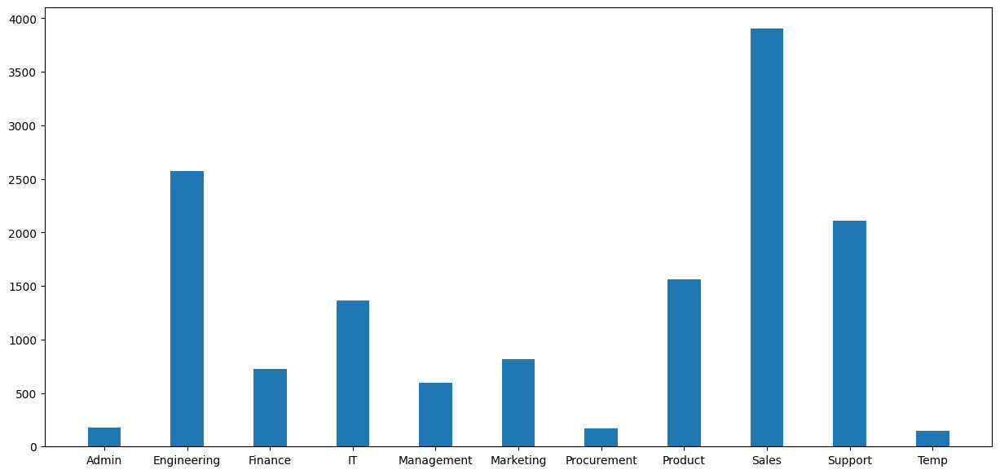

In [18]:
# creating the bar plot
fig = plt.figure(figsize=(15, 7))
plt.bar(dept_count_df['DEPT_NAME'], dept_count_df['COUNT'], width = 0.4)
plt.show()

<Axes: xlabel='TENURE', ylabel='count'>

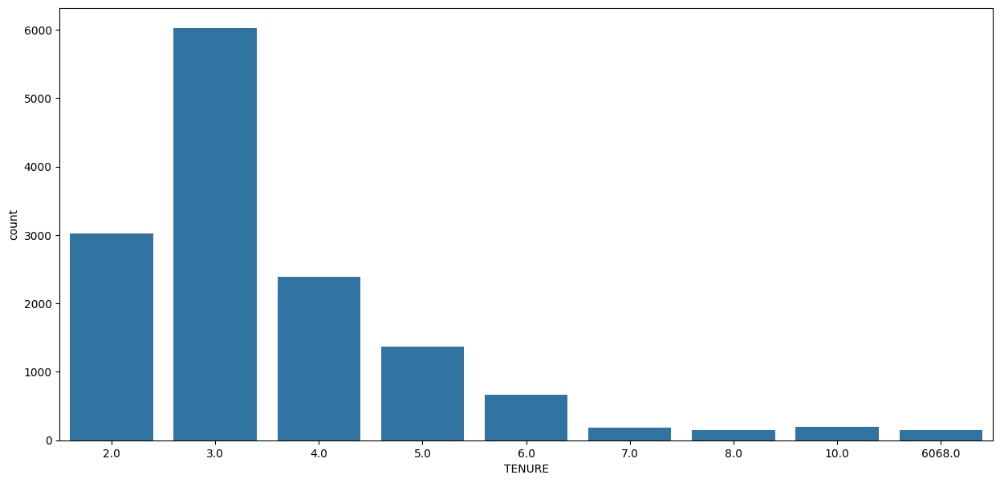

In [19]:
# univariate categorical data analysis - tenure
fig = plt.figure(figsize=(15, 7))
sns.countplot(x='TENURE', data=employee_data)

##### 1.2 Pie Charts

[0, 0, 0, 0, 0, 0, 0, 0.2, 0, 0, 0]


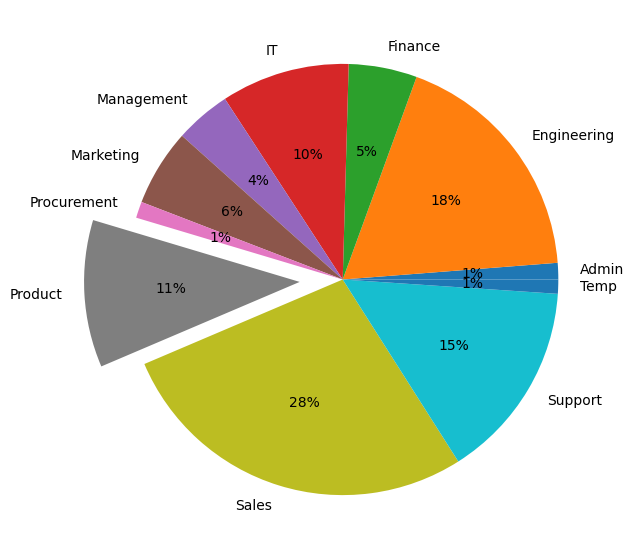

In [20]:
# plotting data on chart 

fig = plt.figure(figsize=(15, 7))
explode = [0 for x in range(11)] 
# make the the bigger chunk stand apart
# idx = np.argmax(dept_count_df['COUNT'])
# explode[idx] = 0.2
# optional - make random chunk stand apart
idx = random.randint(0, len(explode))
explode[idx] = 0.2
print(explode)
# explode = [0,0,0.2,0,0,0,0,0,0,0,0]

plt.pie(dept_count_df['COUNT'], labels=dept_count_df['DEPT_NAME'], explode=explode, autopct='%.0f%%') 
  
# displaying chart 
plt.show() 

### 2 Univariate Continuous Data

##### 2.1 Historgrams

(array([  31.,  130.,  507., 2696., 2273., 1895., 1921., 2381., 1873.,
         443.]),
 array([ 49. ,  75.1, 101.2, 127.3, 153.4, 179.5, 205.6, 231.7, 257.8,
        283.9, 310. ]),
 <BarContainer object of 10 artists>)

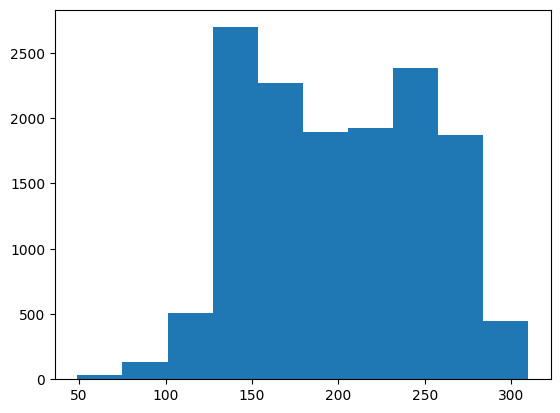

In [21]:
# histogram plot
plt.hist(x='AVG_MONTHLY_HRS', data=employee_data)

##### 2.2 KDE Plots

<Axes: xlabel='AVG_MONTHLY_HRS', ylabel='Density'>

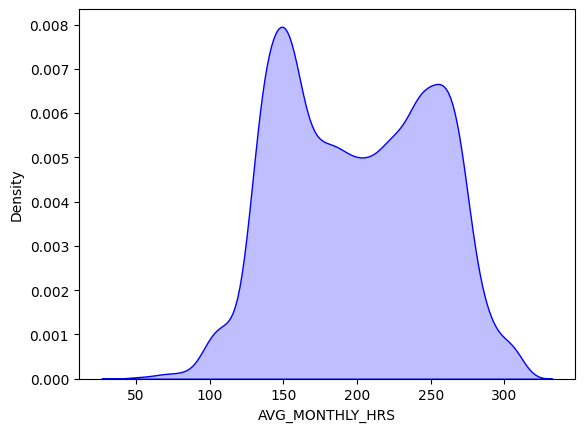

In [22]:
# Plotting the KDE Plot
sns.kdeplot(employee_data['AVG_MONTHLY_HRS'], color='b', fill=True, label='AVG_MONTHLY_HRS')

##### 2.3 Rug Plots

<Axes: xlabel='AVG_MONTHLY_HRS'>

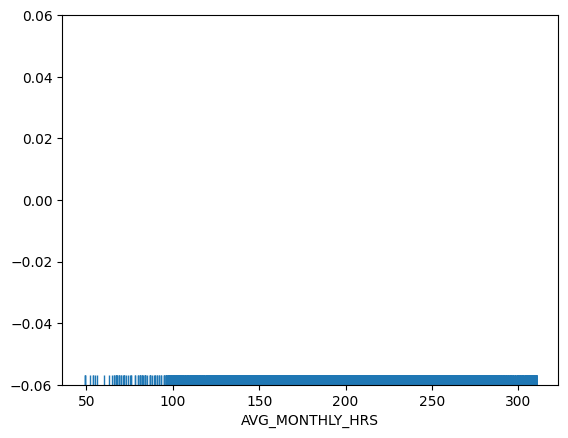

In [23]:
sns.rugplot(data=employee_data, x="AVG_MONTHLY_HRS")

In [24]:
# We can mix 2 plots at a time as shown below
# KDE plot & RUG plot 

<Axes: xlabel='AVG_MONTHLY_HRS', ylabel='Density'>

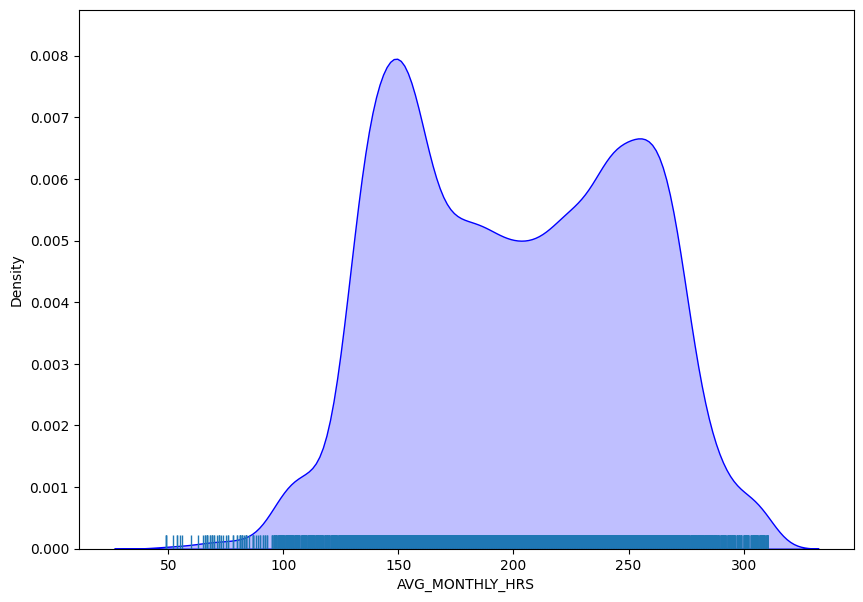

In [25]:
fig = plt.figure(figsize=(10, 7))
sns.kdeplot(employee_data['AVG_MONTHLY_HRS'], color='b', fill=True, label='AVG_MONTHLY_HRS')
sns.rugplot(data=employee_data, x="AVG_MONTHLY_HRS")

<Axes: xlabel='SATISFACTION', ylabel='Density'>

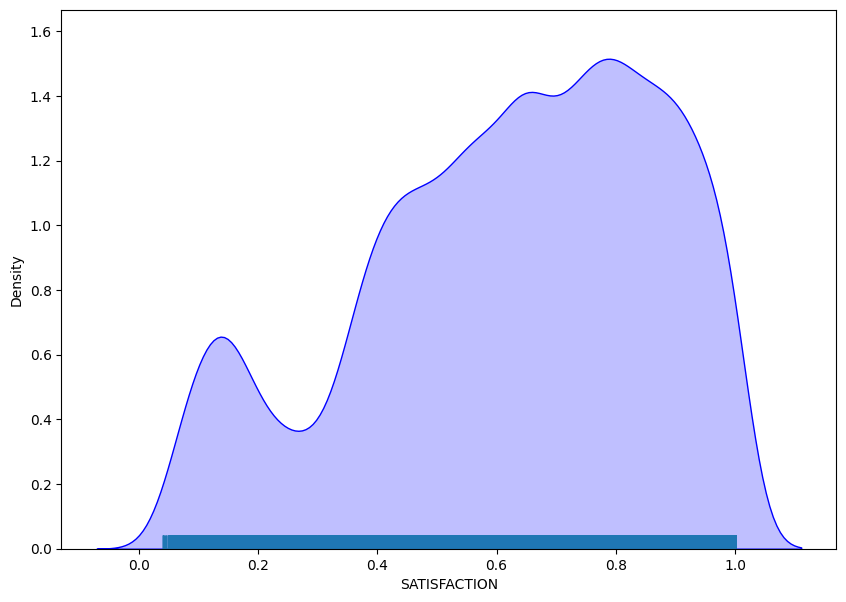

In [26]:
fig = plt.figure(figsize=(10, 7))
sns.kdeplot(employee_data['SATISFACTION'], color='b', fill=True, label='SATISFACTION')
sns.rugplot(data=employee_data, x="SATISFACTION")

##### 2.4 Box Plots

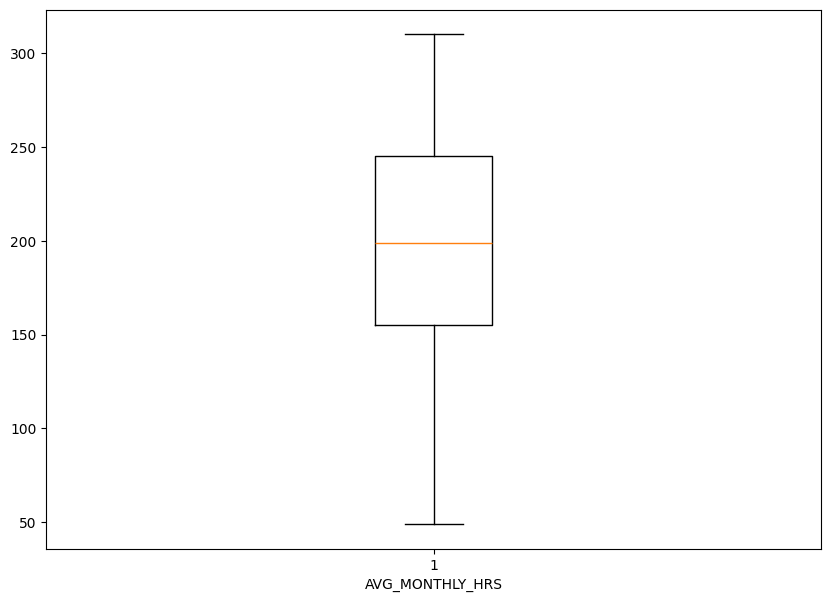

In [27]:
# it is used if there are any outliers
# other than "box plots" there are "viloin charts" avaialble if there are any outliers

fig = plt.figure(figsize=(10, 7))
plt.boxplot(employee_data['AVG_MONTHLY_HRS'])
plt.xlabel('AVG_MONTHLY_HRS')
plt.show()

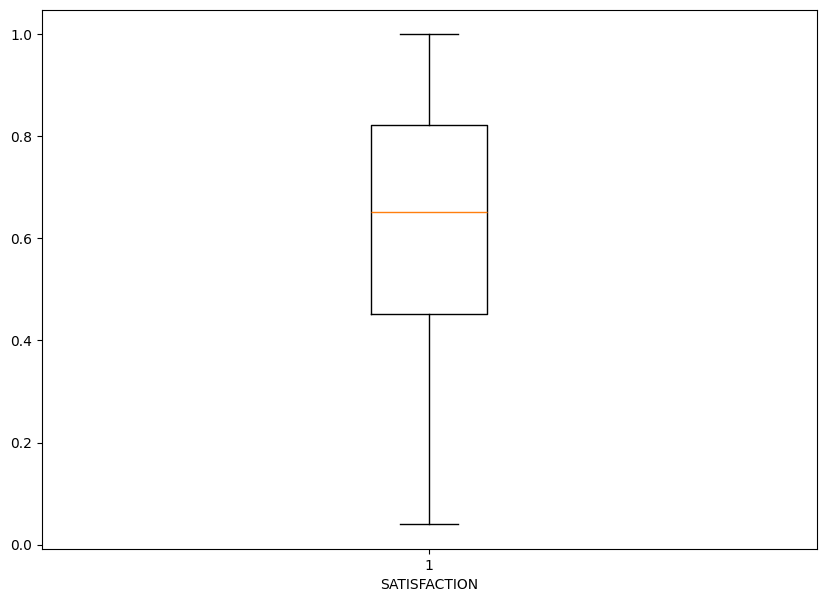

In [28]:
fig = plt.figure(figsize=(10, 7))
plt.boxplot(employee_data['SATISFACTION'])
plt.xlabel('SATISFACTION')
plt.show()

Text(0, 0.5, 'Probability Density')

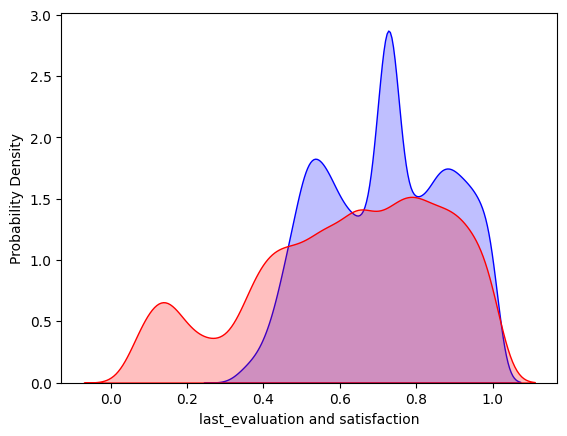

In [29]:
# Plotting the KDE Plot
# we can merge 2 continuos columns [LAST_EVALUATION & SATISFACTION]

sns.kdeplot(employee_data['LAST_EVALUATION'], color='b', fill=True, label='LAST_EVALUATION')
sns.kdeplot(employee_data['SATISFACTION'], color='r', fill=True, label='SATISFACTION')
plt.xlabel('last_evaluation and satisfaction')
plt.ylabel('Probability Density')

### 3 Bivariate Plots


- if we want to understand what is the effect of 1 variable on another variable
- whenever there are 2 columns and if we want to see how they look like when i plotted we can use "bivariate plots"

##### 3.1 Scatter plot using two continuous columns

<Axes: xlabel='AVG_MONTHLY_HRS', ylabel='SATISFACTION'>

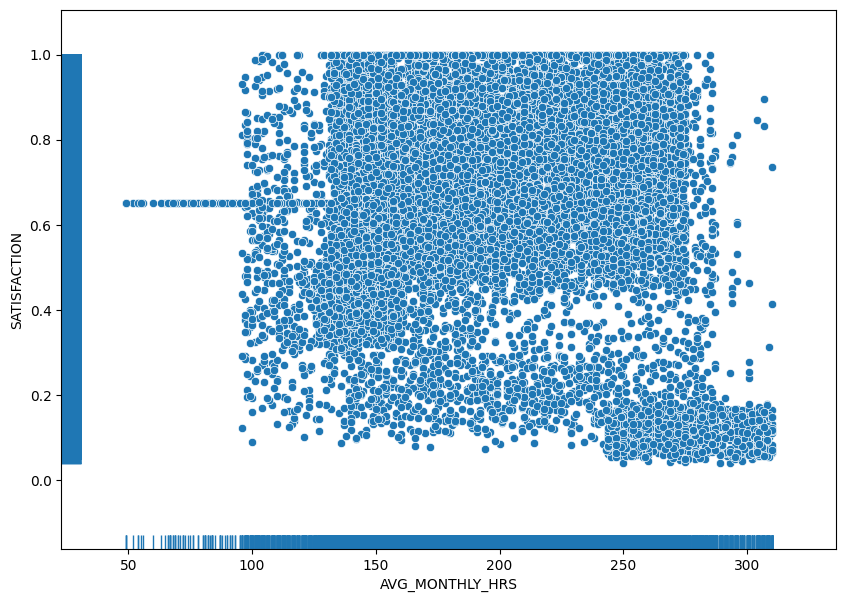

In [30]:
# scatter plot and rug plot of two variables(bi variate)
fig = plt.figure(figsize=(10, 7))
sns.scatterplot(data=employee_data, x='AVG_MONTHLY_HRS', y='SATISFACTION')
sns.rugplot(data=employee_data, x='AVG_MONTHLY_HRS', y='SATISFACTION')


##### 3.2 Scatter plot with one continuous and one categorical

<Axes: xlabel='DEPT_NAME', ylabel='SATISFACTION'>

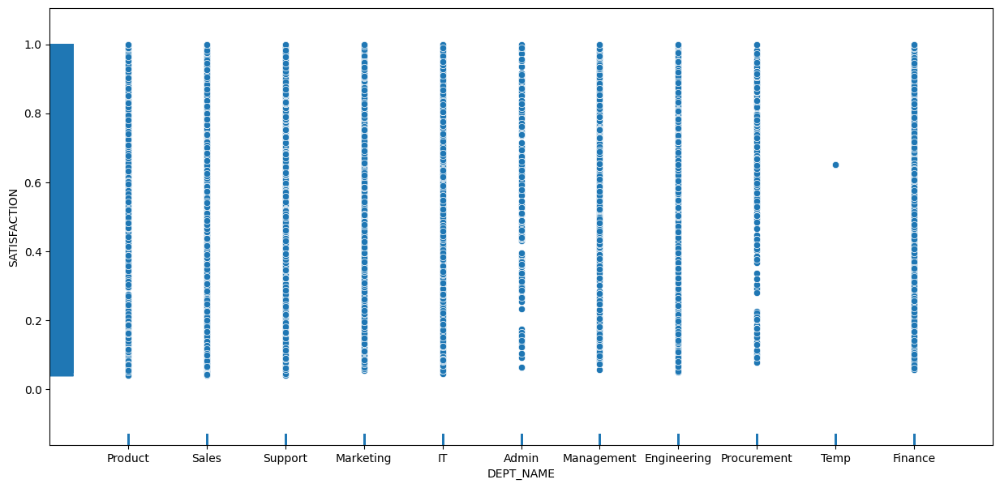

In [31]:
fig = plt.figure(figsize=(15, 7))
sns.scatterplot(data=employee_data, x='DEPT_NAME', y='SATISFACTION')
sns.rugplot(data=employee_data, x='DEPT_NAME', y='SATISFACTION')

<Axes: xlabel='LAST_EVALUATION', ylabel='SATISFACTION'>

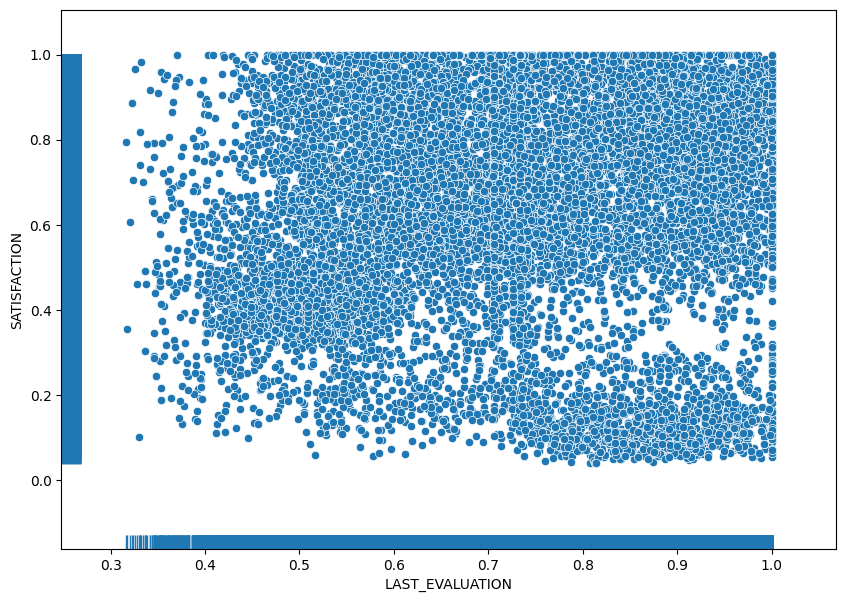

In [32]:
fig = plt.figure(figsize=(10, 7))
sns.scatterplot(data=employee_data, x='LAST_EVALUATION', y='SATISFACTION')
sns.rugplot(data=employee_data, x='LAST_EVALUATION', y='SATISFACTION')

<Axes: xlabel='AVG_MONTHLY_HRS', ylabel='DEPT_NAME'>

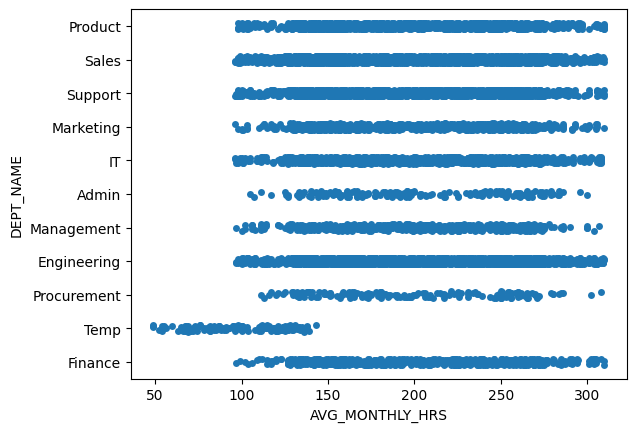

In [33]:
# strip plot for a continous column against a categorical column
sns.stripplot(data=employee_data, x='AVG_MONTHLY_HRS', y='DEPT_NAME')

In [34]:
! pip install histograms

You should consider upgrading via the 'C:\Users\HP\AppData\Local\Programs\Python\Python310\python.exe -m pip install --upgrade pip' command.


In [35]:
! pip install nbformat

You should consider upgrading via the 'C:\Users\HP\AppData\Local\Programs\Python\Python310\python.exe -m pip install --upgrade pip' command.


In [36]:
pip install ipykernel

Note: you may need to restart the kernel to use updated packages.


You should consider upgrading via the 'c:\Users\HP\AppData\Local\Programs\Python\Python310\python.exe -m pip install --upgrade pip' command.


In [37]:
pip install --upgrade nbformat

Note: you may need to restart the kernel to use updated packages.


You should consider upgrading via the 'c:\Users\HP\AppData\Local\Programs\Python\Python310\python.exe -m pip install --upgrade pip' command.


In [38]:
# univariate analysis.
fig = px.histogram(employee_data, x='DEPT_NAME', color='DEPT_NAME')
fig.show()

In [39]:
fig = px.histogram(employee_data, x='DEPT_NAME', color='STATUS')
fig.show()

In [40]:
fig = px.histogram(employee_data, x='DEPT_NAME', color='RECENTLY_PROMOTED')
fig.show()

In [42]:
fig = px.pie(employee_data.groupby('DEPT_NAME').agg({'EMPLOYEE_ID':'count'}).reset_index().rename(columns={'EMPLOYEE_ID':'COUNT'}),
             values='COUNT', names='DEPT_NAME', title='DEPARTMENT PIE CHART')
fig.show()

In [43]:
employee_data.groupby(['FILED_COMPLAINT', 'STATUS'])['FILED_COMPLAINT'].aggregate(['count']).reset_index()

,FILED_COMPLAINT,STATUS,count
0,0.0,Employed,8890
1,0.0,Left,3214
2,1.0,Employed,1894
3,1.0,Left,152


In [44]:
fig = px.histogram(employee_data, x='FILED_COMPLAINT', color='STATUS')
fig.show()

In [45]:
fig = px.histogram(employee_data, x='DEPT_NAME', color='FILED_COMPLAINT')
fig.show()

In [46]:
# likelihood of leaving the company is higher for Tenures ranging 3 - 6
fig = px.histogram(employee_data, x='TENURE', color='STATUS')
fig.show()

In [47]:
fig = px.histogram(employee_data, x='TENURE', color='RECENTLY_PROMOTED')
fig.show()

#### Analysis with more features

In [48]:
# plot of categorical and continous values.
# The majority of the employees for each department have lesser evaluation ratings as compred to the ones who have not left.
fig = px.violin(employee_data, x = 'DEPT_NAME', y='LAST_EVALUATION', color='STATUS')
fig.show()

In [49]:
fig = px.violin(employee_data, x = 'DEPT_NAME', y='AVG_MONTHLY_HRS', color='STATUS')
fig.show()

In [50]:
# the tentative working hours seems a problem across departments. 
# employees having higher working hours tend to leave the company.
fig = px.strip(employee_data, x = 'DEPT_NAME', y='AVG_MONTHLY_HRS', color='STATUS')
fig.show()

In [51]:
fig = px.box(employee_data, x="DEPT_NAME", y="AVG_MONTHLY_HRS", points='all', color='STATUS')
fig.show()

In [52]:
## dataframe creation - for plotting
df_combinations = (
    employee_data.groupby(["DEPT_NAME", "TENURE", "STATUS"])
    .size()
    .reset_index()
    .rename(columns={0: "count"})
)
## Creating sunburst chart
# define figure element
fig = px.sunburst(
        df_combinations,
    path=["DEPT_NAME", "TENURE", "STATUS"],
    title="Sunburst Chart",
    color="STATUS",
    # color_discrete_sequence=[medimumvioletred, seagreen],
    height=800,
)
# display the figure
fig.show()

In [53]:
# losing top rated employees who are not satisfied.
fig = px.scatter(employee_data, x="SATISFACTION", y="LAST_EVALUATION", color="STATUS")
fig.show()

In [54]:
fig = px.scatter(employee_data, x="SATISFACTION", y="LAST_EVALUATION", color="FILED_COMPLAINT")
fig.show()

In [55]:
# losing top rated employees who are not satisfied.
fig = px.scatter(employee_data, x="SATISFACTION", y="LAST_EVALUATION", color="STATUS", size='AVG_MONTHLY_HRS', hover_data=['AVG_MONTHLY_HRS'], symbol='FILED_COMPLAINT')
fig.show()

In [56]:
fig = px.scatter(employee_data, x="SATISFACTION", y="AVG_MONTHLY_HRS", color="STATUS")
fig.show()

In [57]:

fig = px.scatter_matrix(employee_data, dimensions=["AVG_MONTHLY_HRS", "RECENTLY_PROMOTED", "FILED_COMPLAINT", "N_PROJECTS", "LAST_EVALUATION", "TENURE", "SATISFACTION"], 
                        color="STATUS", width=1300, height=1300, color_discrete_sequence=px.colors.qualitative.Vivid)
fig.show()

- KEY OBSERVATIONS FROM ABOVE PLOT:
    - It is evident that employees having AVG_MONTHLY_HRS closer to 300 are usually exiting the company.
    - The attrition rate is little less when the employee is promoted who is having close to 300 working hours.
    - Most employees working in 7 difference projects have exited the company.
    - Employee satisfaction closer to zero are having high attrition.
    - Attrition is generally higher when the TENURE is less than 8 Years.

In [58]:
employee_data['STATUS'].value_counts()

STATUS
Employed    10784
Left         3366
Name: count, dtype: int64

In [59]:
import plotly.figure_factory as ff
fig = ff.create_distplot([employee_data['AVG_MONTHLY_HRS'].to_list()], ['distplot'])
fig.show()